<a href="https://colab.research.google.com/github/Heba2424/DEPI_Projects/blob/main/Data_Augmentation_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Saving 8.1433716.jpg to 8.1433716 (3).jpg
Saving 808b5d46d7c811875156d1bad964d592.jpg to 808b5d46d7c811875156d1bad964d592 (1).jpg
Saving 708179-kittens-kitten-cat-cats-baby-cute-748x608.jpg to 708179-kittens-kitten-cat-cats-baby-cute-748x608 (3).jpg
Saving ai-generated-8625146_640.webp to ai-generated-8625146_640 (3).webp
Saving baby-cat-pictures-0cc0nqstcpfl026j.jpg to baby-cat-pictures-0cc0nqstcpfl026j (3).jpg
Saving Cats-in-a-basket-008.jpg to Cats-in-a-basket-008 (3).jpg
Saving fdc8dea25c49436686c2376b1285288f.webp to fdc8dea25c49436686c2376b1285288f (3).webp
Saving images (1).jpeg to images (1) (1).jpeg
Saving images.jpeg to images (3).jpeg
Saving oar2.jpg to oar2 (3).jpg
Displaying images using PIL:


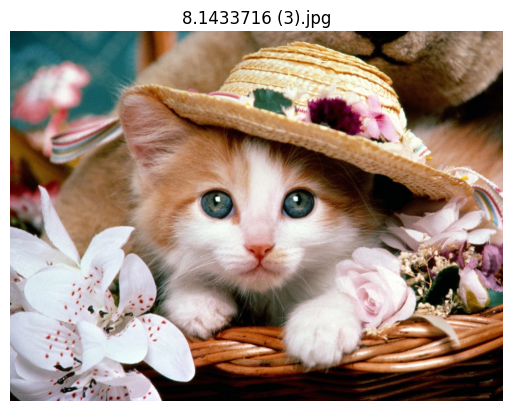

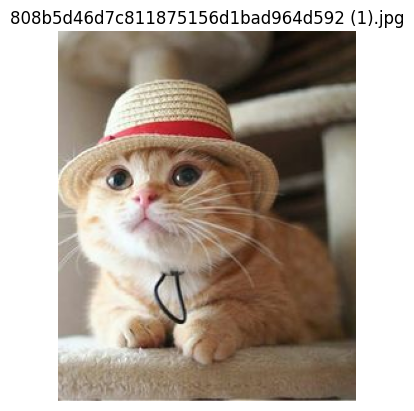

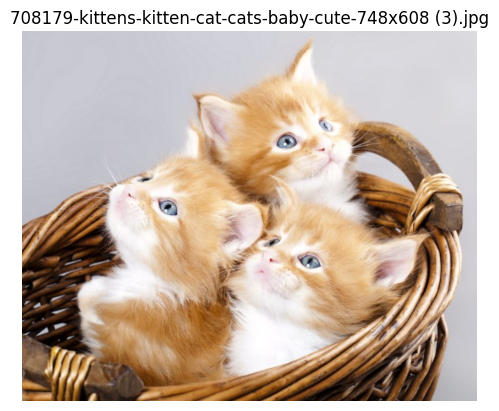

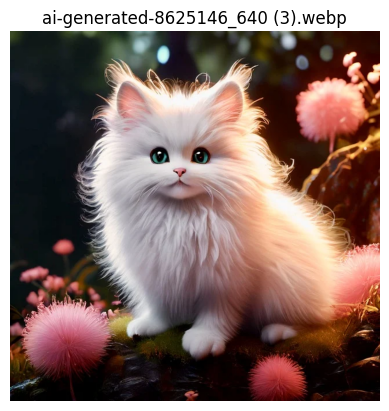

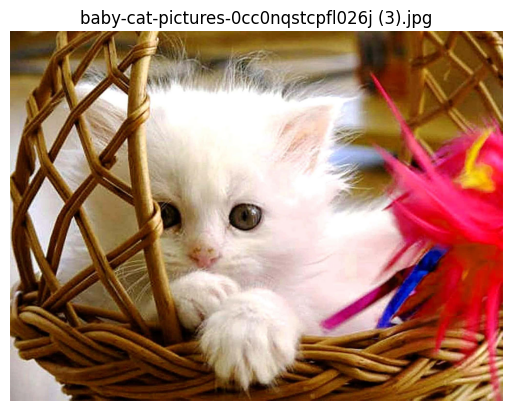

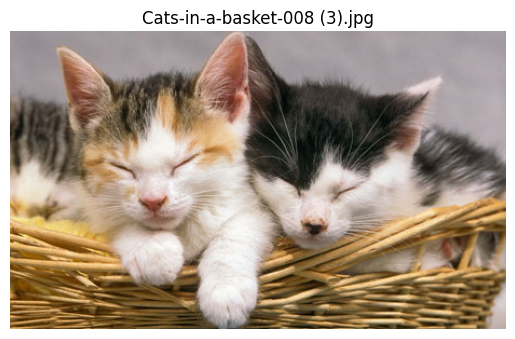

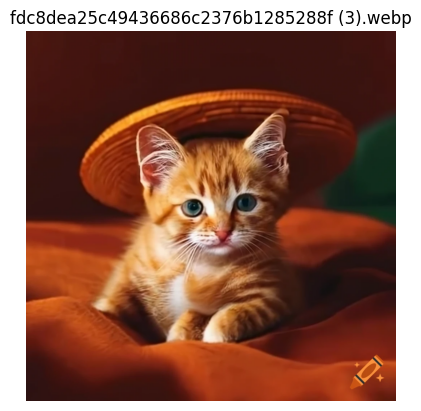

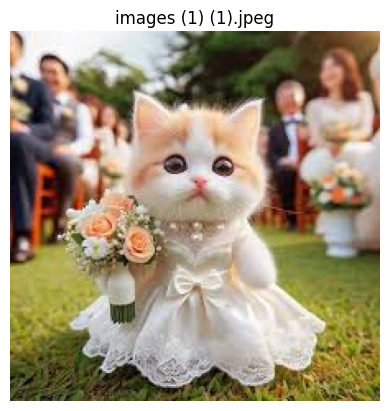

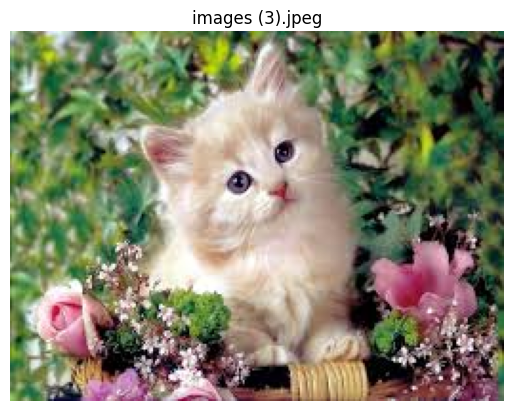

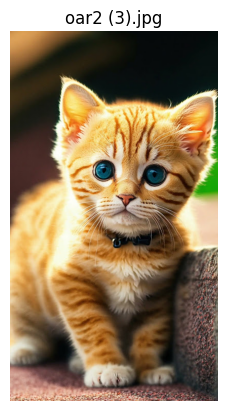

Displaying images using cv2:


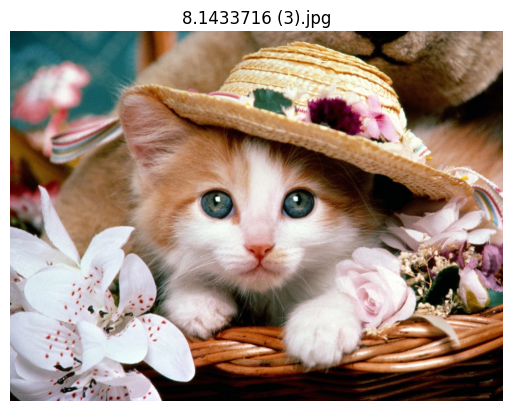

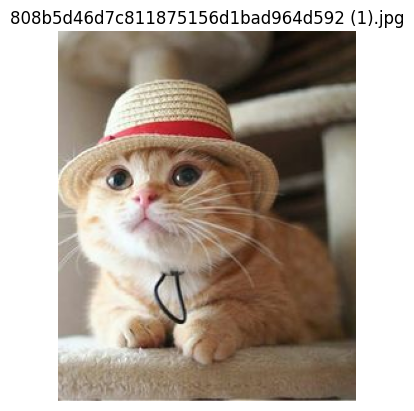

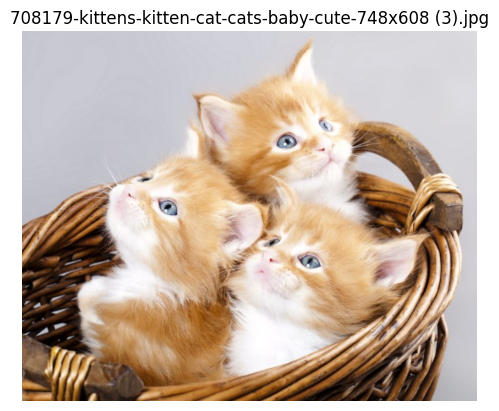

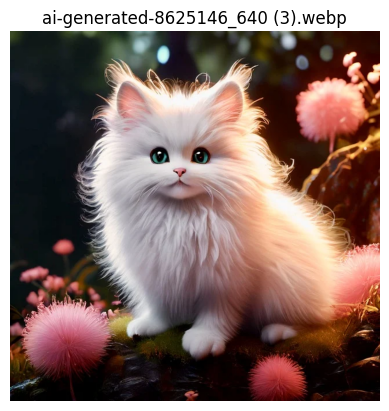

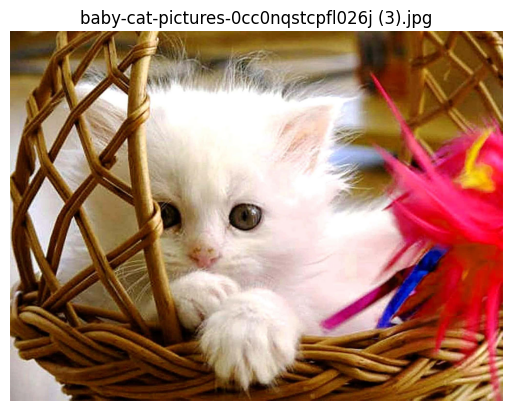

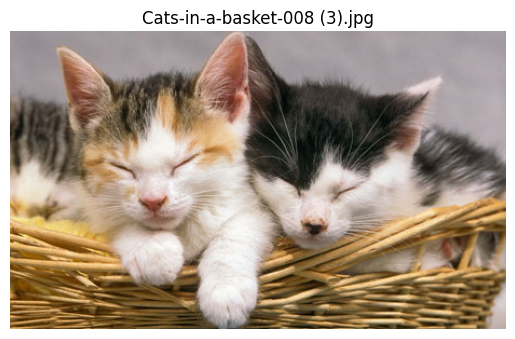

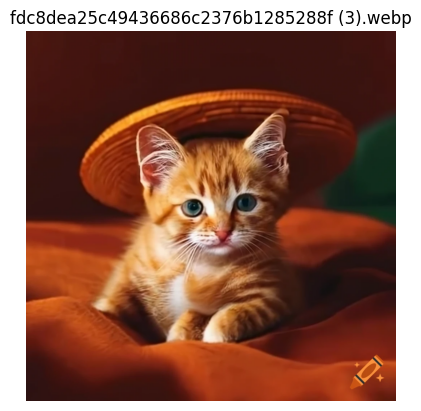

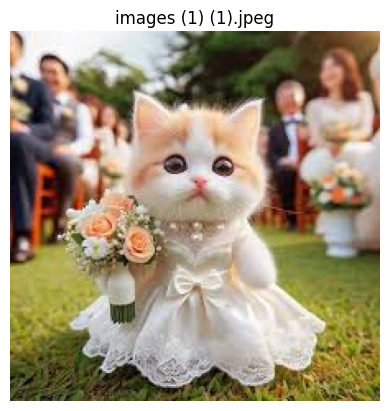

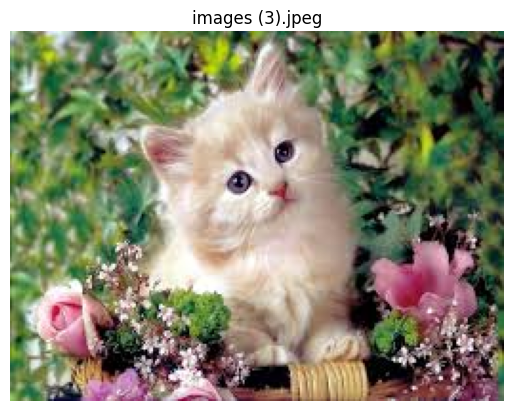

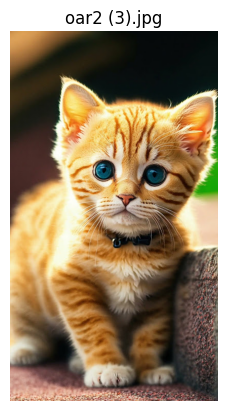

In [ ]:
# Step 1: Upload Images to Colab
from google.colab import files
uploaded = files.upload()

# Step 2: Install Required Libraries
!pip install Pillow
!pip install opencv-python

# Step 3: Import Libraries
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2

# Step 4: Specify the Directory
directory_path = '/content'  # This is where the files are uploaded in Colab

# Step 5: List Image Files and Select First 10
image_files = list(uploaded.keys())[:10]  # Select the first 10 uploaded images

# Option 1: Using PIL
print("Displaying images using PIL:")
for image_file in image_files:
    image_path = os.path.join(directory_path, image_file)
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(image_file)
    plt.axis('off')  # Hide axes
    plt.show()

# Option 2: Using cv2
print("Displaying images using cv2:")
for image_file in image_files:
    image_path = os.path.join(directory_path, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    plt.imshow(image)
    plt.title(image_file)
    plt.axis('off')  # Hide axes
    plt.show()


In [ ]:
!pip install opencv-python

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
print(cv2.__version__)

4.8.0


In [ ]:
# Load an image using 'imread' specifying the path to image
input = cv2.imread("/content/708179-kittens-kitten-cat-cats-baby-cute-748x608 (3).jpg")

In [ ]:
input.shape

(608, 748, 3)

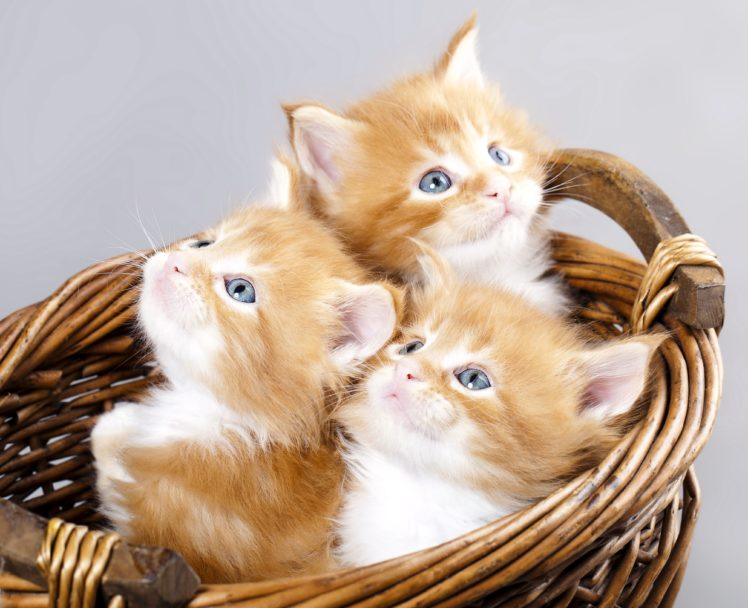

In [ ]:
from google.colab.patches import cv2_imshow
#cv2.imshow() Doesn't work in colab
cv2_imshow(input)

In [ ]:
cv2.imwrite('/content/708179-kittens-kitten-cat-cats-baby-cute-748x608 (3).jpg', input)

True

#Grayscaling

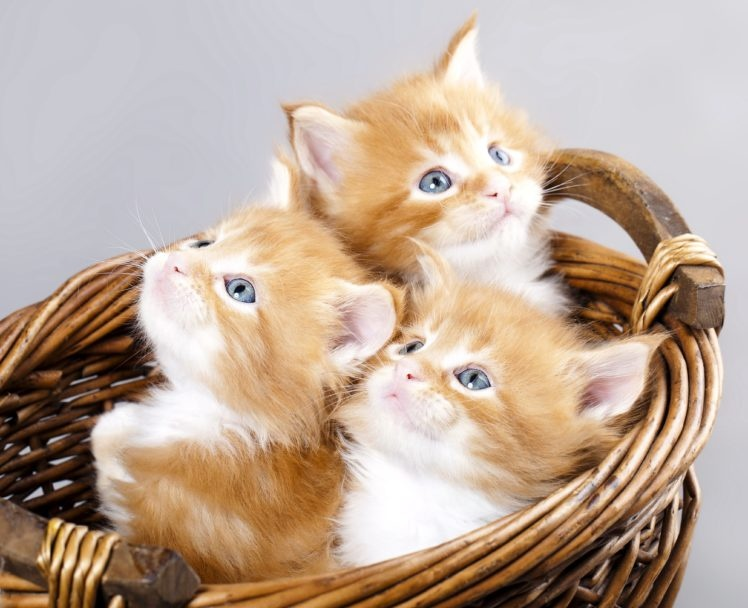

(608, 748, 3)
-------------------------------------------------------------------------


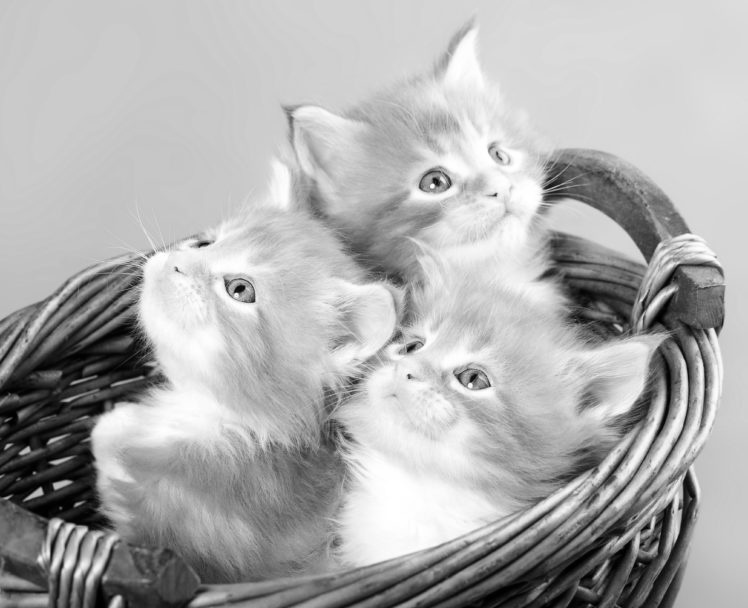

(608, 748)


In [ ]:
image = cv2.imread("/content/708179-kittens-kitten-cat-cats-baby-cute-748x608 (3).jpg")
cv2_imshow(image)
print(image.shape)

print("--------------------------------------------------------------------------------------")

gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #COLOR_BGR2RGB
cv2_imshow(gray_image)
print(gray_image.shape)

HSV image


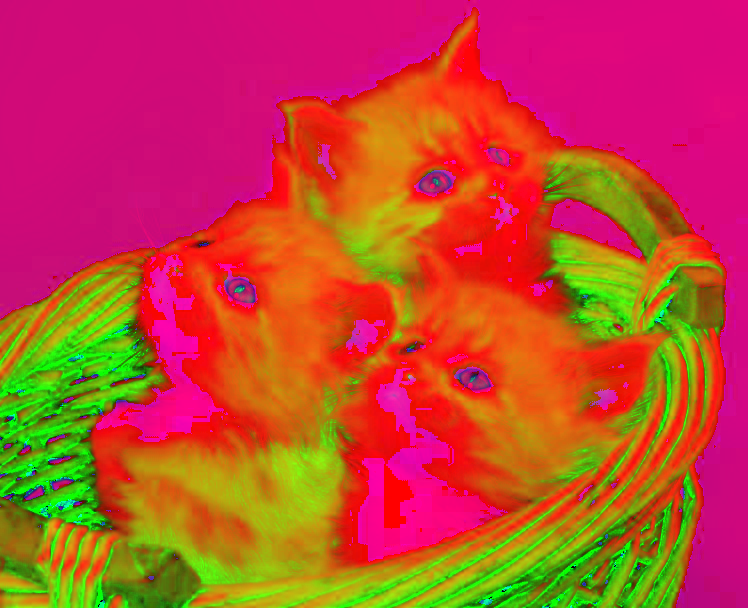

In [ ]:
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
print("HSV image")
cv2_imshow(hsv_image)

#Translations

Translation


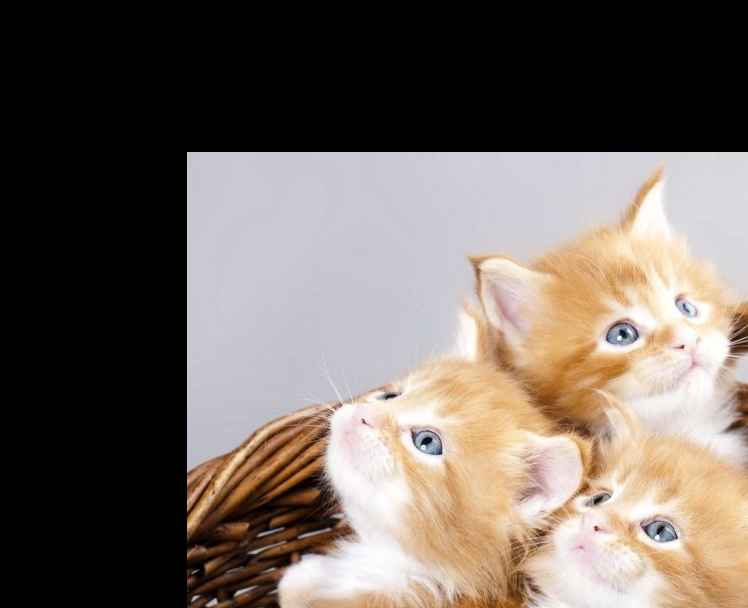

In [ ]:
image = cv2.imread('/content/708179-kittens-kitten-cat-cats-baby-cute-748x608 (3).jpg')

# Store height and width of the image
height, width = image.shape[:2]

quarter_height, quarter_width = height/4, width/4

#       | 1 0 Tx |
#  T  = | 0 1 Ty |

# T is our translation matrix
T = np.float32([[1, 0, quarter_width], [0, 1,quarter_height]])

# We use warpAffine to transform the image using the matrix, T
img_translation = cv2.warpAffine(image, T, (width, height))
print("Translation")
cv2_imshow(img_translation)

In [ ]:
def translate_image(image, x_shifts, y_shifts):
    """
    Translate the image by all combinations of x_shifts and y_shifts.

    Parameters:
    image (numpy array): The input image.
    x_shifts (list of int): List of pixel values to shift the image along the x-axis.
    y_shifts (list of int): List of pixel values to shift the image along the y-axis.

    Returns:
    translations (list of numpy arrays): List of translated images.
    """
    # Get the dimensions of the image
    rows, cols = image.shape[:2]
    translations = []

    # Loop over all combinations of x_shifts and y_shifts
    for x_shift in x_shifts:
        for y_shift in y_shifts:
            # Define the translation matrix
            M = np.float32([[1, 0, x_shift], [0, 1, y_shift]])

            # Perform the translation
            translated_image = cv2.warpAffine(image, M, (cols, rows))
            translations.append(translated_image)

    return translations


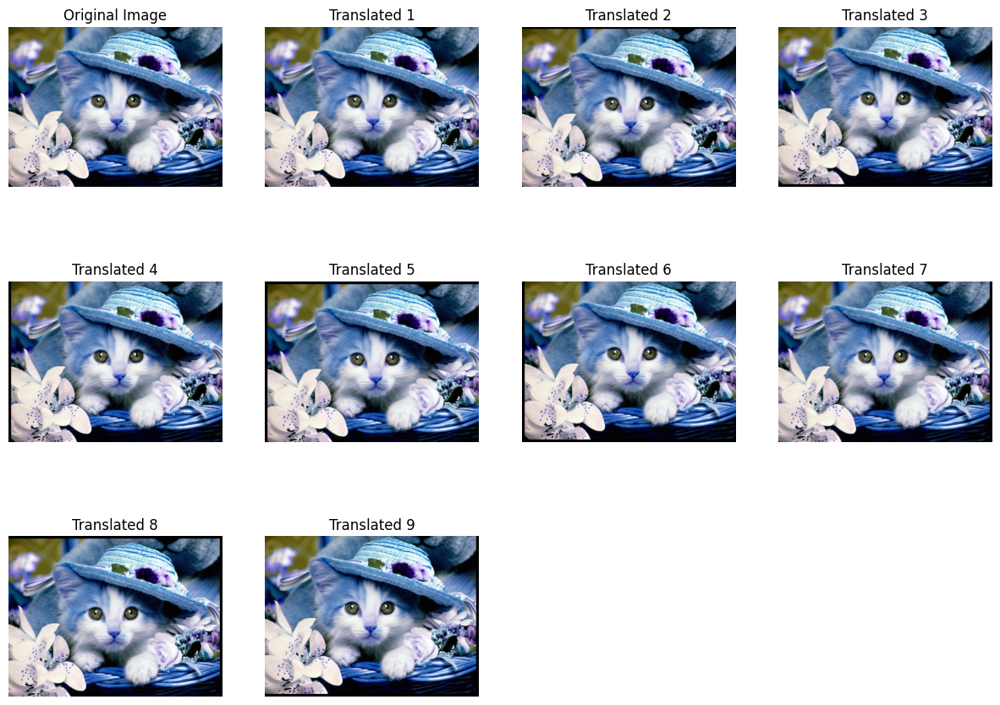

In [ ]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from PIL import Image

# Load the image using PIL and convert to numpy array
image_path = cv2.imread('/content/8.1433716 (1).jpg')
#image = Image.open(image_path)
image = np.array(image_path)

# Ensure the image has 3 color channels
if len(image.shape) == 2:
    image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

# Define translation values
x_shifts = [0, 20, -20]  # Shift right by 20 pixels, left by 20 pixels, and no shift
y_shifts = [0, 20, -20]  # Shift down by 20 pixels, up by 20 pixels, and no shift

# Apply the translations
translated_images = translate_image(image, x_shifts, y_shifts)

# Display the original and translated images
plt.figure(figsize=(15, 15))

plt.subplot(4, 4, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis('off')

# Plot each translated image
for i, translated_image in enumerate(translated_images):
    plt.subplot(4, 4, i+2)
    plt.title(f"Translated {i+1}")
    plt.imshow(translated_image)
    plt.axis('off')

plt.show()


Saving 8.1433716.jpg to 8.1433716 (23).jpg
Saving 808b5d46d7c811875156d1bad964d592.jpg to 808b5d46d7c811875156d1bad964d592 (16).jpg
Saving 708179-kittens-kitten-cat-cats-baby-cute-748x608.jpg to 708179-kittens-kitten-cat-cats-baby-cute-748x608 (16).jpg
Saving ai-generated-8625146_640.webp to ai-generated-8625146_640 (18).webp
Saving baby-cat-pictures-0cc0nqstcpfl026j.jpg to baby-cat-pictures-0cc0nqstcpfl026j (18).jpg
Saving Cats-in-a-basket-008.jpg to Cats-in-a-basket-008 (18).jpg
Saving fdc8dea25c49436686c2376b1285288f.webp to fdc8dea25c49436686c2376b1285288f (18).webp
Saving images (1).jpeg to images (1) (16).jpeg
Saving images.jpeg to images (18).jpeg
Saving oar2.jpg to oar2 (18).jpg


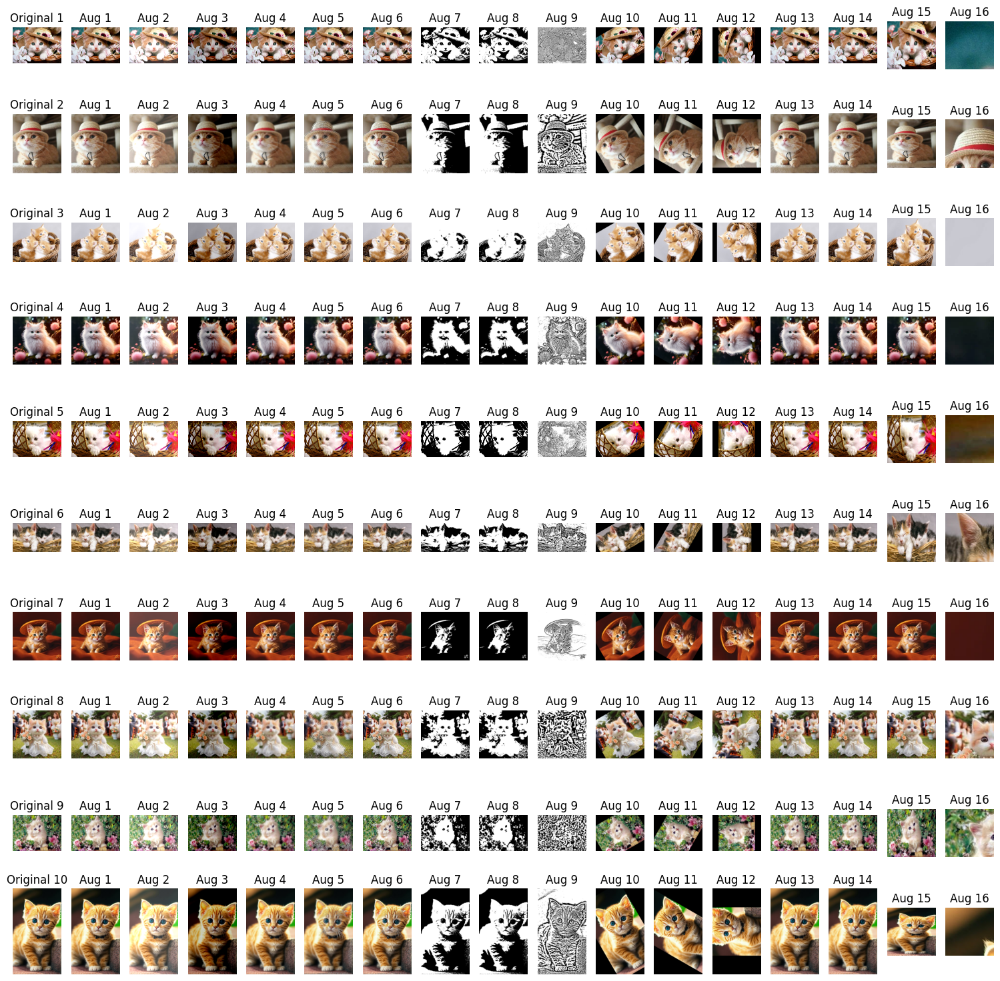

Total number of images generated: 170


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from PIL import Image

def augment_images(images, arithmetic_op=False, conv_blur=False, sharpen=False, threshold=False, binarize=False, adapt_thresh=False, rotations=None, scales=None, resize=None, crop=None):
    """
    Augment a list of images by applying various transformations.

    Parameters:
    images (list of numpy arrays): List of input images.
    arithmetic_op (bool): Apply arithmetic operations (addition and subtraction).
    conv_blur (bool): Apply convolutions and blurring.
    sharpen (bool): Apply sharpening.
    threshold (bool): Apply thresholding.
    binarize (bool): Apply binarization.
    adapt_thresh (bool): Apply adaptive thresholding.
    rotations (list of int): List of rotation degrees.
    scales (list of float): List of scaling factors.
    resize (tuple of int): Resize dimensions (width, height).
    crop (tuple of int): Crop dimensions (left, top, width, height).

    Returns:
    augmented_images (list of numpy arrays): List of augmented images.
    """
    augmented_images = []

    for image in images:
        aug_images = [image.copy()]

        # Apply arithmetic operations
        if arithmetic_op:
            # Addition and Subtraction
            add_image = cv2.add(image, np.ones_like(image) * 50)
            subtract_image = cv2.subtract(image, np.ones_like(image) * 50)
            aug_images.extend([add_image, subtract_image])

        # Apply convolutions and blurring
        if conv_blur:
            # Gaussian Blur
            blur_image = cv2.GaussianBlur(image, (9, 9), 0)
            aug_images.append(blur_image)

            # Convolution (Edge Detection)
            kernel = np.array([[1, 1, 1], [1, -7, 1], [1, 1, 1]])
            conv_image = cv2.filter2D(image, -1, kernel)
            aug_images.append(conv_image)

        # Apply sharpening
        if sharpen:
            # Sharpening
            sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
            sharpen_image = cv2.filter2D(image, -1, sharpen_kernel)
            aug_images.append(sharpen_image)

        # Apply thresholding
        if threshold:
            # Simple Thresholding
            ret, thresh_image = cv2.threshold(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), 127, 255, cv2.THRESH_BINARY)
            aug_images.append(cv2.cvtColor(thresh_image, cv2.COLOR_GRAY2RGB))

        # Apply binarization
        if binarize:
            # Binarization
            ret, bin_image = cv2.threshold(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), 127, 255, cv2.THRESH_BINARY)
            aug_images.append(cv2.cvtColor(bin_image, cv2.COLOR_GRAY2RGB))

        # Apply adaptive thresholding
        if adapt_thresh:
            # Adaptive Thresholding
            adaptive_thresh_image = cv2.adaptiveThreshold(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
            aug_images.append(cv2.cvtColor(adaptive_thresh_image, cv2.COLOR_GRAY2RGB))

        # Apply rotations
        if rotations:
            for angle in rotations:
                # Rotate image by angle degrees clockwise
                rows, cols = image.shape[:2]
                M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
                rotated_image = cv2.warpAffine(image, M, (cols, rows))
                aug_images.append(rotated_image)

        # Apply scaling
        if scales:
            for scale in scales:
                scaled_image = cv2.resize(image, None, fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
                aug_images.append(scaled_image)

        # Apply resizing
        if resize:
            resized_image = cv2.resize(image, resize, interpolation=cv2.INTER_LINEAR)
            aug_images.append(resized_image)

        # Apply cropping
        if crop:
            left, top, width, height = crop
            cropped_image = image[top:top+height, left:left+width]
            aug_images.append(cropped_image)

        augmented_images.extend(aug_images)

    return augmented_images

# Upload 10 images
uploaded = files.upload()

# Load and process each image using PIL and convert to numpy array
images = []
for filename in uploaded.keys():
    image = Image.open(filename).convert('RGB')
    image = np.array(image)
    images.append(image)

# Define augmentation parameters
arithmetic_op = True
conv_blur = True
sharpen = True
threshold = True
binarize = True
adapt_thresh = True
rotations = [30, 60, 90]  # Degrees for rotation
scales = [0.8, 1.2]  # Scaling factors
resize = (150, 150)  # Resize dimensions
crop = (20, 20, 100, 100)  # Crop dimensions (left, top, width, height)

# Apply augmentations to each image
augmented_images = augment_images(images, arithmetic_op=arithmetic_op, conv_blur=conv_blur, sharpen=sharpen,
                                  threshold=threshold, binarize=binarize, adapt_thresh=adapt_thresh,
                                  rotations=rotations, scales=scales, resize=resize, crop=crop)

# Ensure fixed grid size for subplots
num_images = len(images)
num_augmentations = len(augmented_images) // num_images
num_cols = num_augmentations + 1  # +1 for the original image

# Display the original and augmented images
plt.figure(figsize=(15, 15))

for i in range(num_images):
    plt.subplot(num_images, num_cols, i * num_cols + 1)
    plt.title(f"Original {i + 1}")
    plt.imshow(images[i])
    plt.axis('off')

    for j in range(num_augmentations):
        plt.subplot(num_images, num_cols, i * num_cols + j + 2)
        plt.title(f"Aug {j + 1}")
        plt.imshow(augmented_images[i * num_augmentations + j])
        plt.axis('off')

plt.tight_layout()
plt.show()

# Print the total number of images generated
total_images = len(images) + len(augmented_images)
print(f"Total number of images generated: {total_images}")


In [ ]:
# Print the total number of images generated
total_images = len(images) + len(augmented_images)
print(f"Total number of images generated: {total_images}")

Total number of images generated: 170
